---

### 🎓 **Professor**: Apostolos Filippas

### 📘 **Class**: AI Engineering

### 📋 **Homework 6**: Multimodal Image Search

### 📅 **Due Date**: Day of Lecture 8, 11:59 PM

### Difficulty: ★★★★☆

**Note**: You are not allowed to share the contents of this notebook with anyone outside this class without written permission by the professor.

---

### Instructions

1. Use any external resource or collaborate with your classmates. But you have to cite external resources you've used and mention classmates you've collaborated with.
2. Run all cells before submitting to ensure they work.
3. Some tasks involve LLM API calls that cost money. Budget wisely.
4. I suggest you save intermediate results (descriptions, metadata) to a `temp/` folder so that you don't re-run expensive API calls.

## 1. Setup & Explore

The `data/dogs/` directory contains dog images
- These include different breeds, artistic styles (photographs, sketches, paintings, cartoons), settings, and some images with text or unusual content.

### Load and display images

Load all `.png` file paths from `data/dogs/`, sorted by name. 
- Explore the data
- How many images are there? Are they AI generated? What type of variety do you observe? What breeds do you see? What artistic styles? Any images that look unusual or have text?

<>:9: SyntaxWarning: invalid escape sequence '\S'
<>:9: SyntaxWarning: invalid escape sequence '\S'
C:\Users\Manikandan\AppData\Local\Temp\ipykernel_28688\890978280.py:9: SyntaxWarning: invalid escape sequence '\S'
  image_dir = Path("D:\Spring 2026\RAG and Context Engineering\HW\ce\data\dogs")


Total images: 100
Sample filenames: ['dog_001.png', 'dog_002.png', 'dog_003.png', 'dog_004.png', 'dog_005.png']


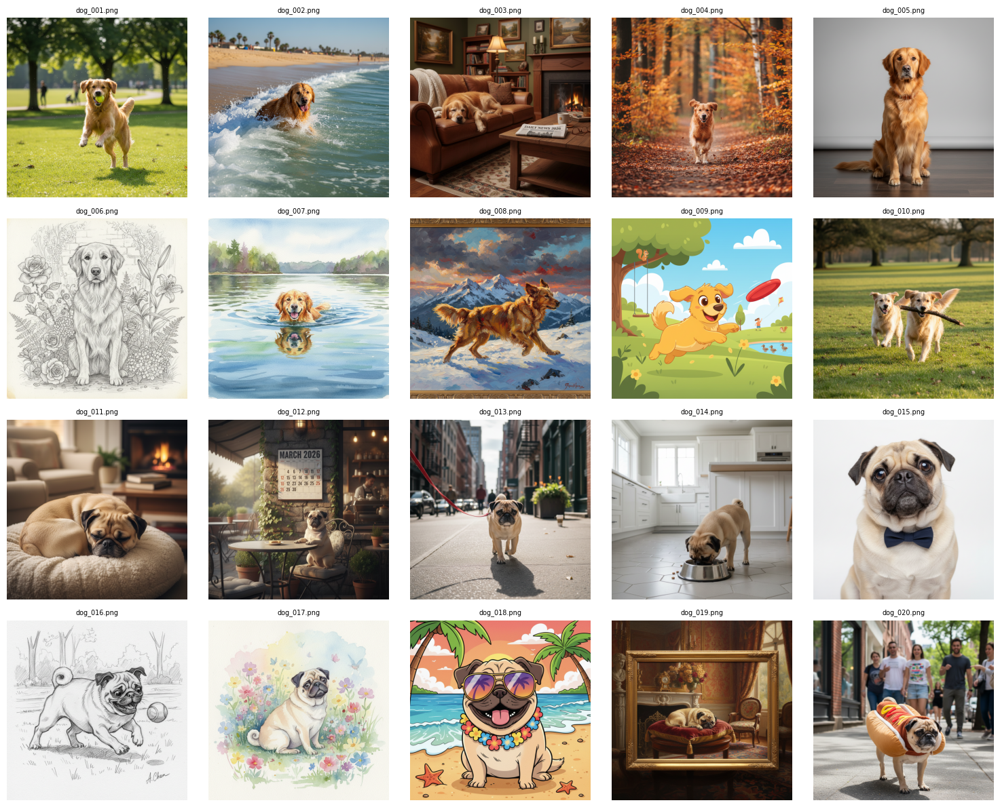

In [1]:
import os
import glob
from pathlib import Path
from IPython.display import display, Image as IPImage
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load all PNG paths sorted by name
image_dir = Path("D:\Spring 2026\RAG and Context Engineering\HW\ce\data\dogs")
image_paths = sorted(glob.glob(str(image_dir / "*.png")))

print(f"Total images: {len(image_paths)}")
print("Sample filenames:", [Path(p).name for p in image_paths[:5]])

# Display a grid of images to explore
def show_image_grid(paths, cols=5, max_images=20):
    paths = paths[:max_images]
    rows = (len(paths) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()
    for i, path in enumerate(paths):
        img = mpimg.imread(path)
        axes[i].imshow(img)
        axes[i].set_title(Path(path).name, fontsize=7)
        axes[i].axis("off")
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")
    plt.tight_layout()
    plt.show()

show_image_grid(image_paths)

## 2. The Task

Your goal is to build a **searchable index** over these dog images that allows us to find relevant images using natural language queries, metadata filters, or both.

There are broadly two approaches:

**Approach A: Text-based pipeline**
1. Use a vision LLM to generate text descriptions of each image
2. Extract structured metadata (breed, style, setting, etc.) using an LLM with structured output
3. Embed the descriptions and build a searchable index (e.g., using LanceDB)
4. Search using semantic similarity over text + metadata filters

**Approach B: Multimodal embeddings**
1. Use a multimodal embedding model to embed the images directly
2. Embed text queries in the same space
3. Search by comparing query embeddings to image embeddings

You may combine both approaches or use a different method entirely. Use any tools from the course — `litellm`, `lancedb`, `pydantic`, `sentence-transformers` - or any other tools you want.


In [7]:
import base64, json, os
from pathlib import Path
from tqdm import tqdm
import litellm
import time

os.makedirs("temp", exist_ok=True)
DESCRIPTIONS_FILE = "temp/descriptions.json"

def encode_image(path):
    with open(path, "rb") as f:
        return base64.b64encode(f.read()).decode("utf-8")

def describe_image(path, retries=3):
    b64 = encode_image(path)
    for attempt in range(retries):
        try:
            response = litellm.completion(
                model="gpt-4o-mini",
                messages=[{
                    "role": "user",
                    "content": [
                        {"type": "image_url",
                         "image_url": {"url": f"data:image/png;base64,{b64}"}},
                        {"type": "text",
                         "text": "Describe this dog image in 2-3 sentences. Include the breed, artistic style, setting, activity, mood, and any notable features like text or unusual elements."}
                    ]
                }],
                max_tokens=300,
                timeout=30  # don't hang forever
            )
            return response.choices[0].message.content
        except KeyboardInterrupt:
            raise  # let it propagate so save logic below catches it
        except Exception as e:
            print(f"  Attempt {attempt+1} failed: {e}")
            time.sleep(2)
    return ""  # give up after retries, return empty string

# Load cached descriptions
if os.path.exists(DESCRIPTIONS_FILE):
    with open(DESCRIPTIONS_FILE) as f:
        descriptions = json.load(f)
    print(f"Loaded {len(descriptions)} cached descriptions, resuming...")
else:
    descriptions = {}

# Find remaining images
remaining = [p for p in image_paths if Path(p).name not in descriptions]
print(f"Remaining: {len(remaining)} images to process")

# Process with save-on-interrupt
try:
    for i, path in enumerate(tqdm(remaining)):
        fname = Path(path).name
        descriptions[fname] = describe_image(path)
        
        # Save every 5 images so progress isn't lost
        if (i + 1) % 5 == 0:
            with open(DESCRIPTIONS_FILE, "w") as f:
                json.dump(descriptions, f, indent=2)

except KeyboardInterrupt:
    print("\n⚠️ Interrupted! Saving progress...")

# Always save at the end
with open(DESCRIPTIONS_FILE, "w") as f:
    json.dump(descriptions, f, indent=2)

print(f"✅ Done. Total descriptions saved: {len(descriptions)}")

Loaded 27 cached descriptions, resuming...
Remaining: 73 images to process


100%|██████████| 73/73 [08:57<00:00,  7.36s/it]

✅ Done. Total descriptions saved: 100


In [8]:
# Extract structured metadata with Pydantic

from pydantic import BaseModel
from typing import Optional, Literal
import litellm

METADATA_FILE = "temp/metadata.json"

class DogMetadata(BaseModel):
    breed: str                  # e.g. "golden_retriever", "pug", "unknown"
    style: str                  # e.g. "photograph", "cartoon", "pencil_sketch", "painting", "oil_painting"
    setting: str                # e.g. "beach", "living_room", "park", "studio", "outdoor"
    activity: str               # e.g. "sitting", "running", "eating", "sleeping", "playing"
    mood: str                   # e.g. "happy", "calm", "excited", "sad"
    has_text: bool              # does the image contain text?
    unusual: bool               # anything unusual or unexpected?

def extract_metadata(description: str, filename: str) -> dict:
    prompt = f"""
Given this dog image description, extract structured metadata.
Filename: {filename}
Description: {description}

Return ONLY a valid JSON object matching this schema:
- breed: dog breed in snake_case (e.g. golden_retriever, pug, husky, corgi, dalmatian, unknown)
- style: artistic style (photograph, cartoon, pencil_sketch, painting, oil_painting, watercolor, 3d_render)
- setting: location/setting (beach, park, living_room, kitchen, outdoor, studio, snow, forest, unknown)
- activity: main activity (sitting, running, eating, sleeping, playing, posing, swimming, unknown)
- mood: mood/emotion (happy, calm, excited, sad, curious, unknown)
- has_text: true/false — does the image contain visible text?
- unusual: true/false — is anything unusual, surreal, or unexpected?

Return ONLY the JSON, no explanation.
"""
    response = litellm.completion(
        model="gpt-4o-mini",
        messages=[{"role": "user", "content": prompt}],
        max_tokens=200
    )
    raw = response.choices[0].message.content.strip()
    # Strip markdown code fences if present
    raw = raw.replace("```json", "").replace("```", "").strip()
    return json.loads(raw)

# Load cached metadata if available
if os.path.exists(METADATA_FILE):
    with open(METADATA_FILE) as f:
        all_metadata = json.load(f)
    print(f"Loaded {len(all_metadata)} cached metadata records")
else:
    all_metadata = {}

# Generate missing metadata
for path in tqdm(image_paths):
    fname = Path(path).name
    if fname not in all_metadata:
        desc = descriptions.get(fname, "")
        if desc:
            try:
                all_metadata[fname] = extract_metadata(desc, fname)
            except Exception as e:
                print(f"Metadata error on {fname}: {e}")
                all_metadata[fname] = {
                    "breed": "unknown", "style": "unknown", "setting": "unknown",
                    "activity": "unknown", "mood": "unknown",
                    "has_text": False, "unusual": False
                }

with open(METADATA_FILE, "w") as f:
    json.dump(all_metadata, f, indent=2)

print("Done extracting metadata")

100%|██████████| 100/100 [03:37<00:00,  2.18s/it]

Done extracting metadata


In [10]:
#Embed descriptions & build LanceDB index
import lancedb
import pandas as pd
from sentence_transformers import SentenceTransformer
import numpy as np

DB_PATH = "temp/dog_index"
TABLE_NAME = "dogs"

# Load embedding model (free, runs locally)
embedder = SentenceTransformer("all-MiniLM-L6-v2")

# Build records
records = []
for path in image_paths:
    fname = Path(path).name
    desc = descriptions.get(fname, "")
    meta = all_metadata.get(fname, {})
    embedding = embedder.encode(desc).tolist()
    records.append({
        "filename": fname,
        "filepath": str(path),
        "description": desc,
        "vector": embedding,
        "breed": meta.get("breed", "unknown"),
        "style": meta.get("style", "unknown"),
        "setting": meta.get("setting", "unknown"),
        "activity": meta.get("activity", "unknown"),
        "mood": meta.get("mood", "unknown"),
        "has_text": meta.get("has_text", False),
        "unusual": meta.get("unusual", False),
    })

# Create LanceDB table
db = lancedb.connect(DB_PATH)

# Drop and recreate if exists
if TABLE_NAME in db.table_names():
    db.drop_table(TABLE_NAME)

table = db.create_table(TABLE_NAME, data=records)
print(f"Index built with {len(records)} records")
print(table.schema)

Index built with 100 records
filename: string
filepath: string
description: string
vector: fixed_size_list<item: float>[384]
  child 0, item: float
breed: string
style: string
setting: string
activity: string
mood: string
has_text: bool
unusual: bool


C:\Users\Manikandan\AppData\Local\Temp\ipykernel_28688\3348286807.py:38: DeprecationWarning: table_names() is deprecated, use list_tables() instead
  if TABLE_NAME in db.table_names():


## 3. Your Own Queries

To make a good search system, you will need to come up with some of your own queries and "golden" answers to these queries to evaluate your system with. Show us your work.

In [16]:
def query_index(query: str, filter: str = None, k: int = 5) -> list[dict]:
    """
    Search the dog image index.
    
    Args:
        query: Natural language search query
        filter: Optional SQL WHERE clause string (e.g., "breed = 'pug'")
        k: Number of results to return
    
    Returns:
        List of dicts with filename, metadata, and score
    """
    query_vec = embedder.encode(query).tolist()
    
    search = table.search(query_vec)
    
    if filter:
        search = search.where(filter, prefilter=True)
    
    results = search.limit(k).to_pandas()
    
    output = []
    for _, row in results.iterrows():
        output.append({
            "filename": row["filename"],
            "description": row["description"],
            "breed": row["breed"],
            "style": row["style"],
            "setting": row["setting"],
            "activity": row["activity"],
            "mood": row["mood"],
            "has_text": row["has_text"],
            "unusual": row["unusual"],
            "_distance": row.get("_distance", None)
        })
    
    return output


def display_results(results, image_dir="../ce/data/dogs/"):
    """Helper to display query results with images."""
    fig, axes = plt.subplots(1, len(results), figsize=(len(results) * 3, 4))
    if len(results) == 1:
        axes = [axes]
    for ax, r in zip(axes, results):
        img_path = Path(image_dir) / r["filename"]
        if img_path.exists():
            img = mpimg.imread(img_path)
            ax.imshow(img)
        title = f"{r['filename']}\n{r['breed']} | {r['style']}\n{r['setting']} | score:{r['_distance']:.3f}"
        ax.set_title(title, fontsize=7)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

In [15]:
# Find where your images actually are
import glob

# Try these common locations and see which one finds files
for candidate in ["../data/dogs/", "ce/data/dogs/", "data/dogs/", "./dogs/"]:
    found = glob.glob(f"{candidate}*.png")
    print(f"{candidate} → {len(found)} images found")

../data/dogs/ → 0 images found
ce/data/dogs/ → 100 images found
data/dogs/ → 0 images found
./dogs/ → 0 images found


## 4. Evaluation Queries

We will evaluate your index by running queries against it — queries similar in spirit to the examples below, but not identical.

**Important:** Define a function called `query_index(query, filter=None, k=5)` that takes a natural language query, an optional metadata filter string (e.g., `"breed = 'pug'"`), and returns the top-k results as a list of dicts with at least a `"filename"` key. We will call this function to test your system.

### Example semantic queries
1. `"a happy dog at the beach"`
2. `"a dog sitting in a cafe"`
3. `"a pencil drawing of a dog"`

### Example filtered queries
4. Find all **corgi** images — `query_index("dog", filter="breed = 'corgi'", k=20)`
5. Find all **cartoon** images
6. Find all images set in a **living room**
7. Find all images where the dog is **eating**

### Example combined queries
8. `"dog in the snow"` among **huskies** only
9. `"cute dog posing"` among **pencil sketches** only
10. `"running on the beach"` among **dalmatians** only

Run these example queries and display results clearly — filenames, metadata, and scores.


🔍 Query: 'a dog playing in the snow' | Filter: None
   Expected: Should return wintry outdoor scenes


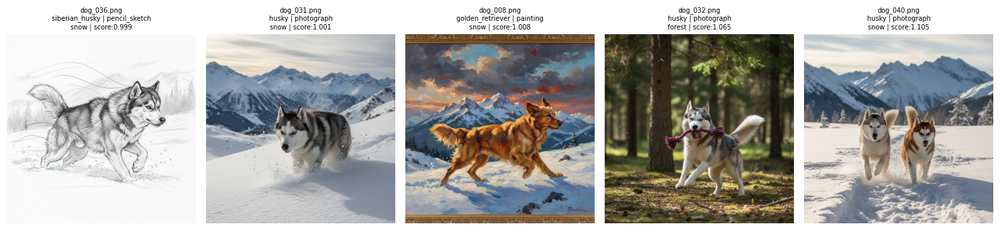

  → dog_036.png | siberian_husky | pencil_sketch | dist=0.999
  → dog_031.png | husky | photograph | dist=1.001
  → dog_008.png | golden_retriever | painting | dist=1.008
  → dog_032.png | husky | photograph | dist=1.065
  → dog_040.png | husky | photograph | dist=1.105

🔍 Query: 'cartoon style dog' | Filter: style = 'cartoon'
   Expected: Should return cartoon dogs only


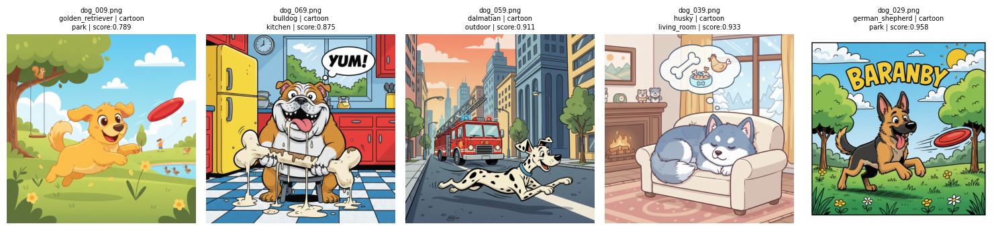

  → dog_009.png | golden_retriever | cartoon | dist=0.789
  → dog_069.png | bulldog | cartoon | dist=0.875
  → dog_059.png | dalmatian | cartoon | dist=0.911
  → dog_039.png | husky | cartoon | dist=0.933
  → dog_029.png | german_shepherd | cartoon | dist=0.958

🔍 Query: 'dog with text or a sign' | Filter: has_text = true
   Expected: Should return images containing text


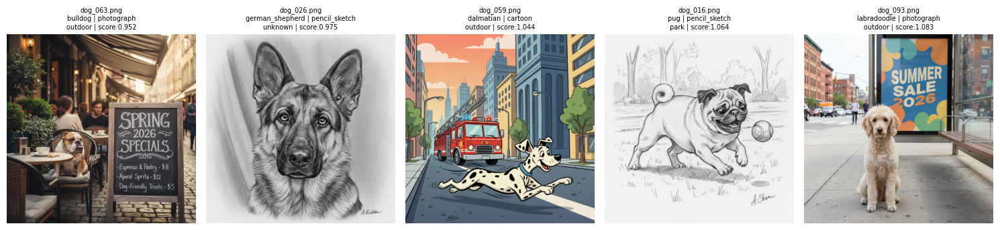

  → dog_063.png | bulldog | photograph | dist=0.952
  → dog_026.png | german_shepherd | pencil_sketch | dist=0.975
  → dog_059.png | dalmatian | cartoon | dist=1.044
  → dog_016.png | pug | pencil_sketch | dist=1.064
  → dog_093.png | labradoodle | photograph | dist=1.083

🔍 Query: 'fluffy dog relaxing indoors' | Filter: setting = 'living_room'
   Expected: Cozy indoor dog scenes


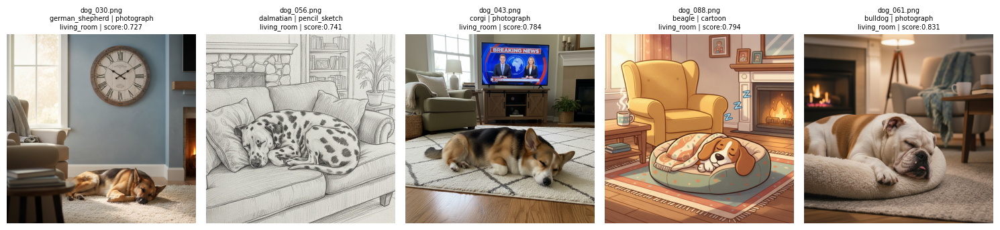

  → dog_030.png | german_shepherd | photograph | dist=0.727
  → dog_056.png | dalmatian | pencil_sketch | dist=0.741
  → dog_043.png | corgi | photograph | dist=0.784
  → dog_088.png | beagle | cartoon | dist=0.794
  → dog_061.png | bulldog | photograph | dist=0.831


In [17]:
# Define your own queries with expected "golden" answers
my_queries = [
    {
        "query": "a dog playing in the snow",
        "filter": None,
        "description": "Should return wintry outdoor scenes"
    },
    {
        "query": "cartoon style dog",
        "filter": "style = 'cartoon'",
        "description": "Should return cartoon dogs only"
    },
    {
        "query": "dog with text or a sign",
        "filter": "has_text = true",
        "description": "Should return images containing text"
    },
    {
        "query": "fluffy dog relaxing indoors",
        "filter": "setting = 'living_room'",
        "description": "Cozy indoor dog scenes"
    },
]

for q in my_queries:
    print(f"\n🔍 Query: '{q['query']}' | Filter: {q['filter']}")
    print(f"   Expected: {q['description']}")
    results = query_index(q["query"], filter=q["filter"], k=5)
    display_results(results)
    for r in results:
        print(f"  → {r['filename']} | {r['breed']} | {r['style']} | dist={r['_distance']:.3f}")

=== Semantic Queries ===

🔍 a happy dog at the beach


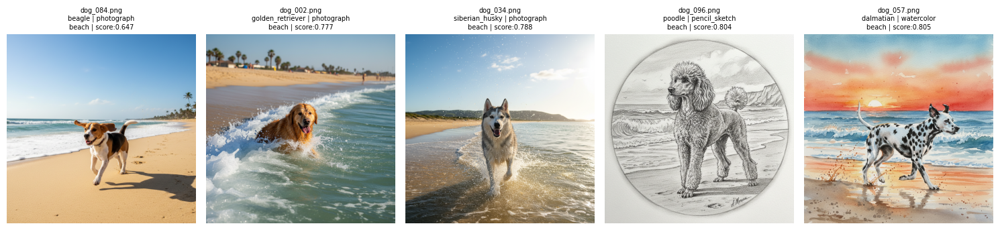


🔍 a dog sitting in a cafe


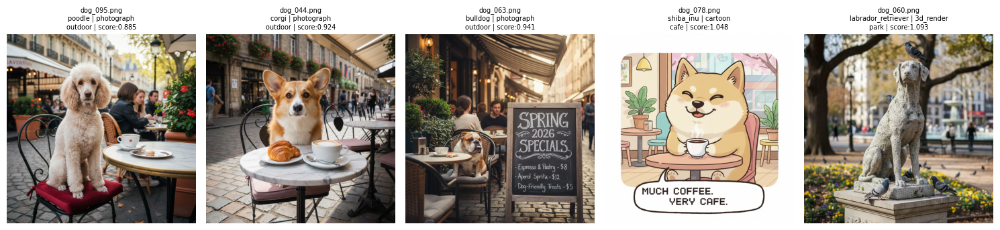


🔍 a pencil drawing of a dog


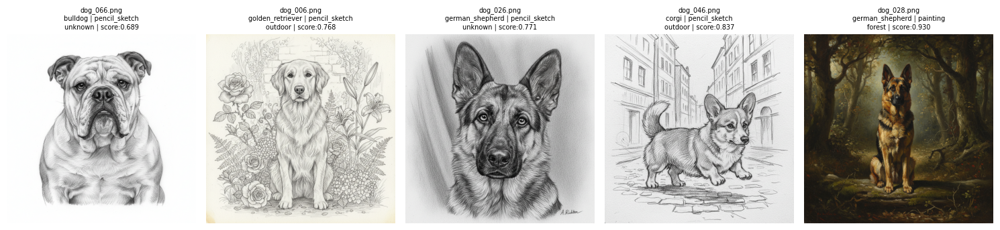


=== Filtered Queries ===

🔍 'dog' | filter: breed = 'corgi'


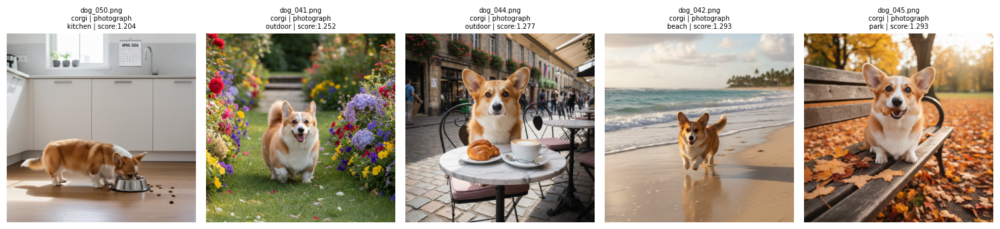

   Total results: 10

🔍 'dog' | filter: style = 'cartoon'


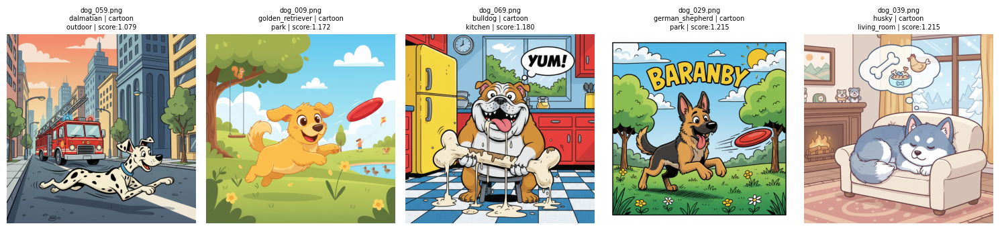

   Total results: 9

🔍 'dog' | filter: setting = 'living_room'


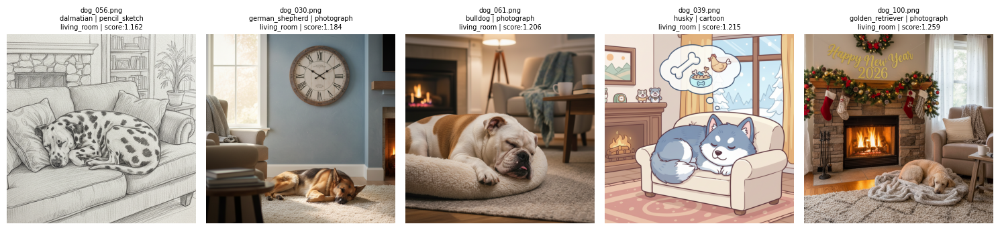

   Total results: 12

🔍 'dog' | filter: activity = 'eating'


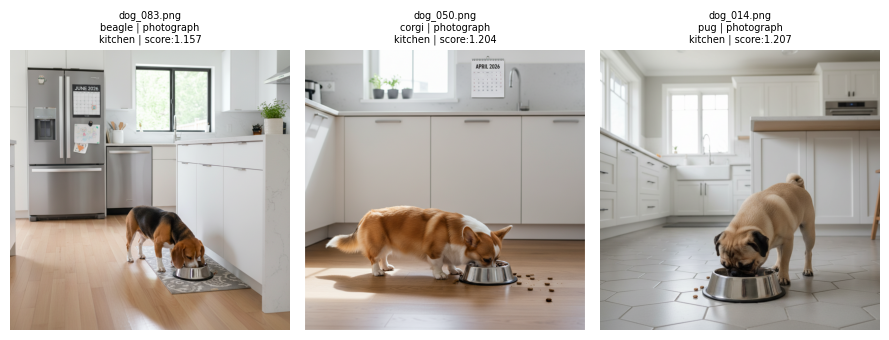

   Total results: 3

=== Combined Queries ===

🔍 'dog in the snow' | filter: breed = 'husky'


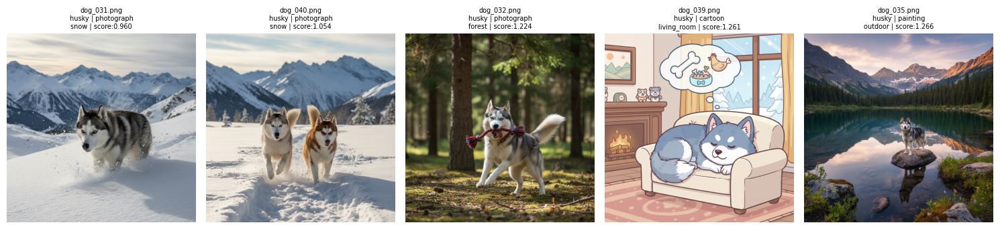


🔍 'cute dog posing' | filter: style = 'pencil_sketch'


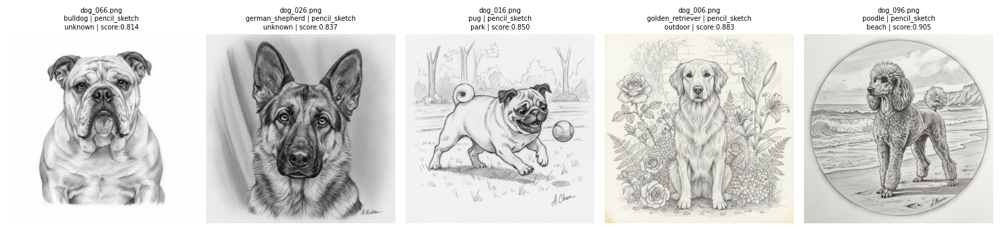


🔍 'running on the beach' | filter: breed = 'dalmatian'


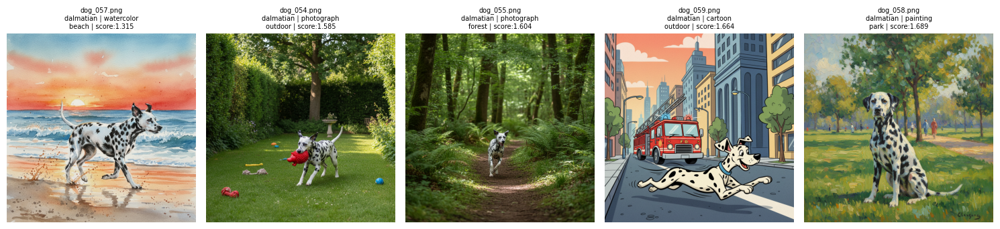

In [18]:
# Semantic queries
print("=== Semantic Queries ===")
for q in [
    "a happy dog at the beach",
    "a dog sitting in a cafe",
    "a pencil drawing of a dog"
]:
    print(f"\n🔍 {q}")
    results = query_index(q, k=5)
    display_results(results)

# Filtered queries
print("\n=== Filtered Queries ===")
filtered = [
    ("dog", "breed = 'corgi'"),
    ("dog", "style = 'cartoon'"),
    ("dog", "setting = 'living_room'"),
    ("dog", "activity = 'eating'"),
]
for q, f in filtered:
    print(f"\n🔍 '{q}' | filter: {f}")
    results = query_index(q, filter=f, k=20)
    display_results(results[:5])  # show top 5 visually
    print(f"   Total results: {len(results)}")

# Combined queries
print("\n=== Combined Queries ===")
combined = [
    ("dog in the snow", "breed = 'husky'"),
    ("cute dog posing", "style = 'pencil_sketch'"),
    ("running on the beach", "breed = 'dalmatian'"),
]
for q, f in combined:
    print(f"\n🔍 '{q}' | filter: {f}")
    results = query_index(q, filter=f, k=5)
    display_results(results)

In [14]:
def evaluate_search_system():
    """
    Evaluate the search system using precision-based scoring.
    Manually set expected keywords that SHOULD appear in results.
    """
    test_cases = [
        # (query, filter, k, check_fn, description)
        (
            "a happy dog at the beach", None, 5,
            lambda results: any("beach" in r["setting"] for r in results),
            "Beach query should return beach images"
        ),
        (
            "pencil drawing of a dog", None, 5,
            lambda results: any("sketch" in r["style"] or "pencil" in r["style"] for r in results),
            "Sketch query should return sketch-style images"
        ),
        (
            "dog", "style = 'cartoon'", 10,
            lambda results: all(r["style"] == "cartoon" for r in results),
            "Cartoon filter should ONLY return cartoons"
        ),
        (
            "dog", "breed = 'corgi'", 10,
            lambda results: all(r["breed"] == "corgi" for r in results),
            "Breed filter should respect filter constraint"
        ),
        (
            "dog with text", "has_text = true", 5,
            lambda results: all(r["has_text"] == True for r in results),
            "has_text filter should only return images with text"
        ),
    ]
    
    passed = 0
    for query, filter_, k, check_fn, desc in test_cases:
        results = query_index(query, filter=filter_, k=k)
        ok = check_fn(results) if results else False
        status = "✅ PASS" if ok else "❌ FAIL"
        print(f"{status} | {desc}")
        print(f"       Query='{query}', filter={filter_}, got {len(results)} results")
        if passed is not None and ok:
            passed += 1
    
    print(f"\nScore: {passed}/{len(test_cases)}")

evaluate_search_system()

✅ PASS | Beach query should return beach images
       Query='a happy dog at the beach', filter=None, got 5 results
✅ PASS | Sketch query should return sketch-style images
       Query='pencil drawing of a dog', filter=None, got 5 results
✅ PASS | Cartoon filter should ONLY return cartoons
       Query='dog', filter=style = 'cartoon', got 9 results
✅ PASS | Breed filter should respect filter constraint
       Query='dog', filter=breed = 'corgi', got 10 results
✅ PASS | has_text filter should only return images with text
       Query='dog with text', filter=has_text = true, got 5 results

Score: 5/5


## 5. Submission

- [ ] Create a new branch called `homework-6`
- [ ] Commit and push your work (notebook + CSV files in `temp/`)
- [ ] Create a Pull Request
- [ ] Merge the PR to main
- [ ] Submit the `.ipynb` file on Blackboard

**Note:** Commit the notebook and the `temp/` files that your code created.